In [1]:
%matplotlib inline


import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import numpy as np

import sklearn as skl
import scipy as sci
import scipy.io as sio

import statsmodels.api as sm

from sklearn import linear_model, model_selection, metrics, preprocessing, decomposition, cluster
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
from google.colab import drive

drive.mount('/content/drive/', force_remount=True)

data_path='/content/drive/MyDrive/2022_SFC_IDSP/Project Dry Beans Dataset/'
results_path='/content/drive/My Drive/2022_SFC_IDSP/Project Dry Beans Dataset/'

Mounted at /content/drive/


# Dataset

In [3]:
db= pd.read_excel(data_path+'Dry_Beans_Dataset.xlsx', sheet_name='Dry_Beans_Dataset')
db.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
db.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

In [5]:
data_describe = db.describe().head()

In [6]:
data_describe.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703


In [7]:
data_describe.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4'],
      dtype='object')

In [8]:
data_describe.dtypes

Area               float64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea         float64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
dtype: object

In [9]:
db =db.astype({'Class':'category'})
#db.dtypes

In [10]:
db.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

## Histograms

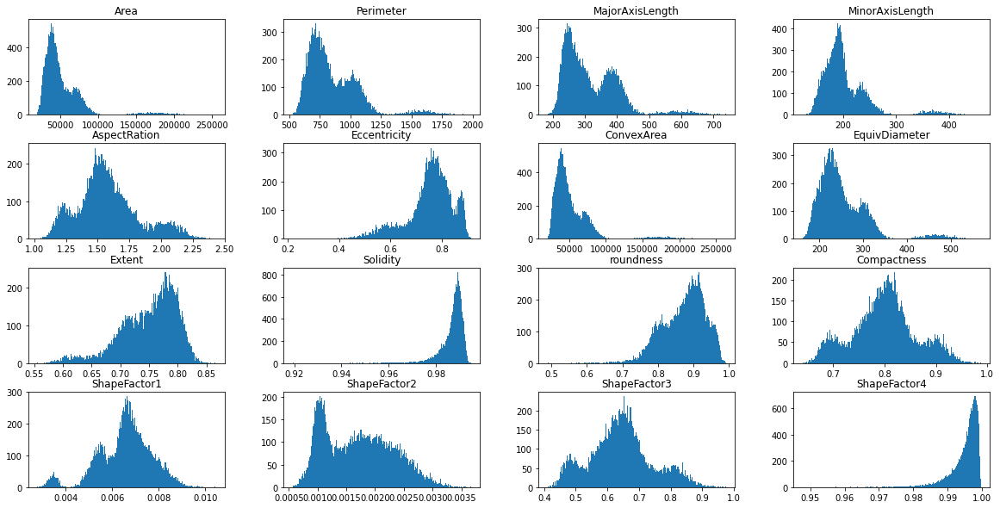

In [11]:

db_hist=db.hist(layout=(4,4),bins=200, grid=False, figsize=(20,10))
#fig.savefig(results_path+'histograms.png')
#fig.savefig(results_path+'histograms.df')

In [12]:
area=db['Area'].copy()
perimeter=db['Perimeter'].copy()
majorAxisLength=db['MajorAxisLength'].copy()
minorAxisLength=db['MinorAxisLength'].copy()
aspectRation=db['AspectRation'].copy()
eccentricity=db['Eccentricity'].copy()
convexArea=db['ConvexArea'].copy()
equivDiameter=db['EquivDiameter'].copy()
extent=db['Extent'].copy()
solidity=db['Solidity'].copy()
roundness=db['roundness'].copy()
compactness=db['Compactness'].copy()
shapeFactor1=db['ShapeFactor1'].copy()
shapeFactor2=db['ShapeFactor2'].copy()
shapeFactor3=db['ShapeFactor3'].copy()
shapeFactor4=db['ShapeFactor4'].copy()

In [13]:
print('\u03BC = ', area.mean(),'\u03C3 =', area.std())

μ =  53048.284549261625 σ = 29324.095716881944


# Probability density function
/estimation

In [14]:
xmin, xmax = area.min(),area.max()
thy_range = np.linspace(xmin, xmax, 100)

In [15]:
thy_dist=sci.stats.norm.pdf(thy_range,area.mean(),area.std())

In [16]:
xminp, xmaxp = perimeter.min(),perimeter.max()
thy_range_p = np.linspace(xminp, xmaxp, 100)

In [17]:
thy_dist_p=sci.stats.norm.pdf(thy_range_p,perimeter.mean(),perimeter.std())

In [18]:
xmin_mj, xmax_mj = majorAxisLength.min(),majorAxisLength.max()
thy_range_mj = np.linspace(xmin_mj, xmax_mj, 100)

In [19]:
thy_dist_mj=sci.stats.norm.pdf(thy_range_mj,majorAxisLength.mean(),majorAxisLength.std())

In [20]:
xmin_mn, xmax_mn = minorAxisLength.min(),minorAxisLength.max()
thy_range_mn = np.linspace(xmin_mn, xmax_mn, 100)

In [21]:
thy_dist_mn=sci.stats.norm.pdf(thy_range_mn,minorAxisLength.mean(),minorAxisLength.std())

In [22]:
xmin_ecc, xmax_ecc = eccentricity.min(),eccentricity.max()
thy_range_ecc = np.linspace(xmin_ecc, xmax_ecc, 100)

In [23]:
thy_dist_ecc=sci.stats.norm.pdf(thy_range_ecc,eccentricity.mean(),eccentricity.std())

In [24]:
xmin_cv, xmax_cv = convexArea.min(),convexArea.max()
thy_range_cv = np.linspace(xmin_cv, xmax_cv, 100)

In [25]:
thy_dist_cv=sci.stats.norm.pdf(thy_range_cv,convexArea.mean(),convexArea.std())

13611 116


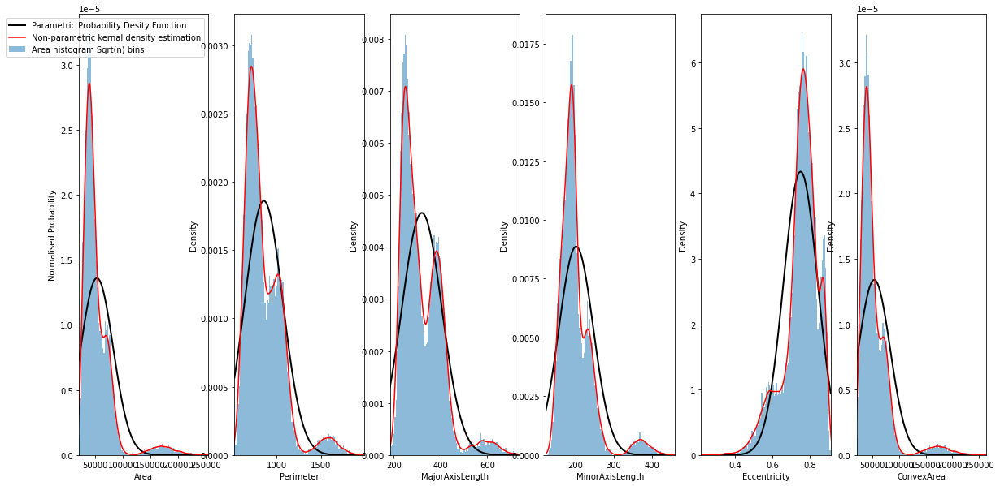

In [26]:
from numpy.core.numeric import array_equal
bin_size=int(len(area)**0.5)

print(len(area), bin_size)

fig=plt.figure(figsize =(20,10))

#set the range of x values to the max and min of the data
fig.add_subplot(1,6,1)
plt.xlim(area.min(),area.max())
plt.plot(thy_range,thy_dist,'k', linewidth=2)
area.plot.kde(color='Red')
plt.hist(area, density=True, bins=bin_size, alpha=0.5)
plt.xlabel('Area')
plt.ylabel('Normalised Probability')
plt.legend([ 'Parametric Probability Desity Function','Non-parametric kernal density estimation','Area histogram Sqrt(n) bins'])

fig.add_subplot(1,6,2)
plt.xlim(perimeter.min(),perimeter.max())
plt.plot(thy_range_p,thy_dist_p,'k', linewidth=2)
perimeter.plot.kde(color='Red')
plt.hist(perimeter, density=True, bins=bin_size, alpha=0.5)
plt.xlabel('Perimeter')
#plt.ylabel('Normalised Probability')
#plt.legend([ 'Parametric Probability Desity Function','Non-parametric kernal density estimation','Perimeter histogram Sqrt(n) bins'])

fig.add_subplot(1,6,3)
plt.xlim(majorAxisLength.min(),majorAxisLength.max())
plt.plot(thy_range_mj,thy_dist_mj,'k', linewidth=2)
majorAxisLength.plot.kde(color='Red')
plt.hist(majorAxisLength, density=True, bins=bin_size, alpha=0.5)
plt.xlabel('MajorAxisLength')
#plt.ylabel('Normalised Probability')
#plt.legend([ 'Parametric Probability Desity Function','Non-parametric kernal density estimation','majorAxisLength histogram Sqrt(n) bins'])

fig.add_subplot(1,6,4)
plt.xlim(minorAxisLength.min(),minorAxisLength.max())
plt.plot(thy_range_mn,thy_dist_mn,'k', linewidth=2)
minorAxisLength.plot.kde(color='Red')
plt.hist(minorAxisLength, density=True, bins=bin_size, alpha=0.5)
plt.xlabel('MinorAxisLength')
#plt.ylabel('Normalised Probability')
#plt.legend([ 'Parametric Probability Desity Function','Non-parametric kernal density estimation','minorAxisLength histogram Sqrt(n) bins'])

fig.add_subplot(1,6,5)
plt.xlim(eccentricity.min(),eccentricity.max())
plt.plot(thy_range_ecc,thy_dist_ecc,'k', linewidth=2)
eccentricity.plot.kde(color='Red')
plt.hist(eccentricity, density=True, bins=bin_size, alpha=0.5)
plt.xlabel('Eccentricity')
#plt.ylabel('Normalised Probability')
#plt.legend([ 'Parametric Probability Desity Function','Non-parametric kernal density estimation','eccentricity histogram Sqrt(n) bins'])

fig.add_subplot(1,6,6)
plt.xlim(convexArea.min(),convexArea.max())
plt.plot(thy_range_cv,thy_dist_cv,'k', linewidth=2)
convexArea.plot.kde(color='Red')
plt.hist(convexArea, density=True, bins=bin_size, alpha=0.5)
plt.xlabel('ConvexArea')
#plt.ylabel('Normalised Probability')
#plt.legend([ 'Parametric Probability Desity Function','Non-parametric kernal density estimation','convexArea histogram Sqrt(n) bins'])

fig.savefig(results_path+'histograms.png')
fig.savefig(results_path+'histograms.pdf')

non-Gaussian Distribution

## Group_by

### Class (Perimeter)

In [27]:
perimeter_groups = db.groupby('Class')['Perimeter']

In [28]:
perimeter_by_class_summary = db.groupby("Class").Perimeter.agg(
    mean ='mean',
    median = 'median',
    standard_dev='std',
    skew ='skew',
    count ='count',
    min_area='min',
    max_area='max',
 ).copy()

perimeter_by_class_summary

,mean,median,standard_dev,skew,count,min_area,max_area
Class,,,,,,,
BARBUNYA,1046.105764,1045.0600,89.629646,0.070396,1322,759.552,1359.763
BOMBAY,1585.619079,1586.2375,115.900954,0.223291,522,1265.926,1985.370
CALI,1057.634282,1055.4725,67.615137,0.157868,1630,789.770,1326.583
DERMASON,665.209536,664.5230,50.467508,-0.020753,3546,524.736,908.265
HOROZ,919.859676,921.3955,70.045927,-0.243872,1928,689.294,1162.588
SEKER,727.672440,721.2920,47.849014,0.811676,2027,610.291,933.372
SIRA,796.418737,794.9895,44.377084,0.142636,2636,668.106,984.282


#### Summary statistics

In [29]:
perimeter_kurt = []
sigma10 = []

for group in perimeter_groups.groups:
  perimeter_kurt.append(perimeter_groups.get_group(group).copy().kurtosis())

perimeter_by_class_summary['kurtosis'] = perimeter_kurt

perimeter_by_class_summary['expectation delta']= np.abs(perimeter_by_class_summary['mean']-perimeter_by_class_summary['median'])
perimeter_by_class_summary['10% of sigma']=perimeter_by_class_summary['standard_dev']*0.10

perimeter_by_class_summary.to_csv(data_path+ 'Summary_statistics_by_classes')

perimeter_by_class_summary

,mean,median,standard_dev,skew,count,min_area,max_area,kurtosis,expectation delta,10% of sigma
Class,,,,,,,,,,
BARBUNYA,1046.105764,1045.0600,89.629646,0.070396,1322,759.552,1359.763,0.179814,1.045764,8.962965
BOMBAY,1585.619079,1586.2375,115.900954,0.223291,522,1265.926,1985.370,0.012102,0.618421,11.590095
CALI,1057.634282,1055.4725,67.615137,0.157868,1630,789.770,1326.583,0.637381,2.161782,6.761514
DERMASON,665.209536,664.5230,50.467508,-0.020753,3546,524.736,908.265,-0.476104,0.686536,5.046751
HOROZ,919.859676,921.3955,70.045927,-0.243872,1928,689.294,1162.588,0.493554,1.535824,7.004593
SEKER,727.672440,721.2920,47.849014,0.811676,2027,610.291,933.372,0.962249,6.380440,4.784901
SIRA,796.418737,794.9895,44.377084,0.142636,2636,668.106,984.282,0.100194,1.429237,4.437708


**Is my variable well approximated by a normal distribution?**

* Skewness should be between -1 and +1 … **AND**
* Difference between Median and Mean (expectation delta) should be smaller than 10% of the standard deviation (10% of sigma)… **AND**
* kurtosis should be between -3 and 3 **And**
* Histogram shows a good qualitative comparison to fitted normal distribution curve 

Which of these sub populations area means is closest to the overall average mean area. 

Are these subpopulation statisticaly different?


In [30]:
print('mean=', perimeter.mean()) 
print('median =',perimeter.median(),)
print('expectation delta=',perimeter.mean()-perimeter.median())
print('10% of std dev =',perimeter.std()*0.1) 
print('skew =',perimeter.skew())
print('kurtosis =',perimeter.kurtosis())

mean= 855.283458599662
median = 794.9409999999999
expectation delta= 60.34245859966211
10% of std dev = 21.428969589196143
skew = 1.6261235244866195
kurtosis = 3.588123326632573


overall perimeter distribution - not normal

#### Groups histograms

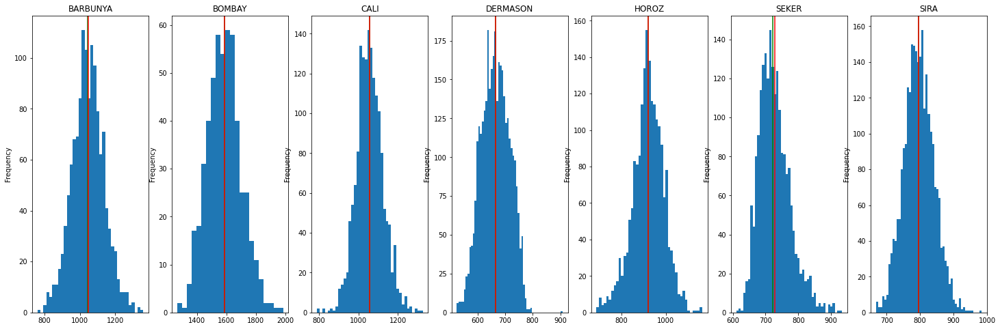

In [31]:
BARBUNYA= perimeter_groups.get_group('BARBUNYA').copy()
BOMBAY= perimeter_groups.get_group('BOMBAY').copy()
CALI= perimeter_groups.get_group('CALI').copy()
DERMASON= perimeter_groups.get_group('DERMASON').copy()
HOROZ= perimeter_groups.get_group('HOROZ').copy()
SEKER= perimeter_groups.get_group('SEKER').copy()
SIRA= perimeter_groups.get_group('SIRA').copy()

fig=plt.figure(figsize=(25,8))


fig.add_subplot(1,7,1)
BARBUNYA.plot.hist(grid=False, bins = 36) 
plt.title('BARBUNYA')
plt.axvline(BARBUNYA.median(),color='green')
plt.axvline(BARBUNYA.mean(),color='red')

fig.add_subplot(1,7,2)
BOMBAY.plot.hist(grid=False, bins = 22) 
plt.title('BOMBAY')
plt.axvline(BOMBAY.median(),color='green')
plt.axvline(BOMBAY.mean(),color='red')

fig.add_subplot(1,7,3)
CALI.plot.hist(grid=False, bins = 40) 
plt.title('CALI')
plt.axvline(CALI.median(),color='green')
plt.axvline(CALI.mean(),color='red')

fig.add_subplot(1,7,4)
DERMASON.plot.hist(grid=False, bins = 59) 
plt.title('DERMASON')
plt.axvline(DERMASON.median(),color='green')
plt.axvline(DERMASON.mean(),color='red')

fig.add_subplot(1,7,5)
HOROZ.plot.hist(grid=False, bins = 43) 
plt.title('HOROZ')
plt.axvline(HOROZ.median(),color='green')
plt.axvline(HOROZ.mean(),color='red')

fig.add_subplot(1,7,6)
SEKER.plot.hist(grid=False, bins = 45) 
plt.title('SEKER')
plt.axvline(SEKER.median(),color='green')
plt.axvline(SEKER.mean(),color='red')

fig.add_subplot(1,7,7)
SIRA.plot.hist(grid=False, bins = 51) 
plt.title('SIRA')
plt.axvline(SIRA.median(),color='green')
plt.axvline(SIRA.mean(),color='red')



plt.savefig(results_path+'perimeter_histograms.png')
plt.savefig(results_path+'perimeter_histograms.pdf')

In [32]:
BARBUNYA.count()**(1/2)

36.359317925395686

In [33]:
BOMBAY.count()**(1/2)

22.847319317591726

In [34]:
CALI.count()**(1/2)

40.3732584763727

In [35]:
DERMASON.count()**(1/2)

59.54829972383762

In [36]:
HOROZ.count()**(1/2)

43.9089968002003

In [37]:
SEKER.count()**(1/2)

45.02221673796171

In [38]:
SIRA.count()**(1/2)

51.34199061197374

#### Box plots

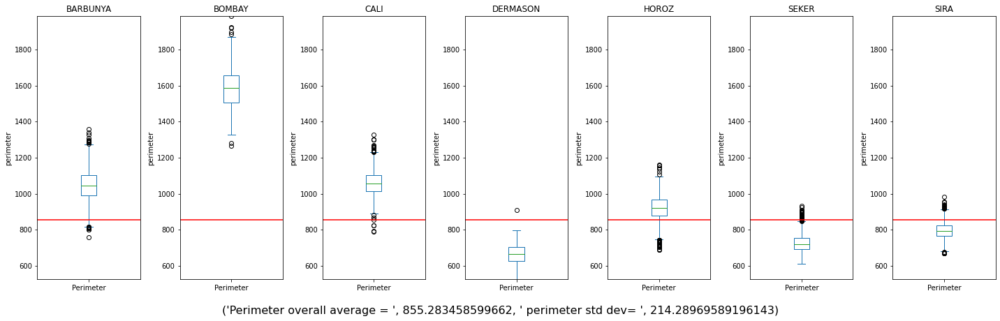

In [39]:
fig = plt.figure(1,figsize=(20,6))
for i,group in enumerate(perimeter_groups.groups,1):

    fig.add_subplot(1,7,i,)
    perimeter_groups.get_group(group).plot.box()
    plt.ylabel('perimeter')
    plt.title(group)
    plt.ylim(db['Perimeter'].min(),db['Perimeter'].max())

    plt.axhline(db['Perimeter'].mean(),color= 'red') #the mean of all area data
caption='Perimeter overall average = ', perimeter.mean(),' perimeter std dev= ', perimeter.std() 
plt.figtext(0.5, -0.05, caption, wrap=True, horizontalalignment='center', fontsize=16)

plt.tight_layout()
plt.show(1)

In [40]:
perimeter_by_class_summary.transpose()

Class,BARBUNYA,BOMBAY,CALI,DERMASON,HOROZ,SEKER,SIRA
mean,1046.105764,1585.619079,1057.634282,665.209536,919.859676,727.672440,796.418737
median,1045.060000,1586.237500,1055.472500,664.523000,921.395500,721.292000,794.989500
standard_dev,89.629646,115.900954,67.615137,50.467508,70.045927,47.849014,44.377084
skew,0.070396,0.223291,0.157868,-0.020753,-0.243872,0.811676,0.142636
count,1322.000000,522.000000,1630.000000,3546.000000,1928.000000,2027.000000,2636.000000
min_area,759.552000,1265.926000,789.770000,524.736000,689.294000,610.291000,668.106000
max_area,1359.763000,1985.370000,1326.583000,908.265000,1162.588000,933.372000,984.282000
kurtosis,0.179814,0.012102,0.637381,-0.476104,0.493554,0.962249,0.100194
expectation delta,1.045764,0.618421,2.161782,0.686536,1.535824,6.380440,1.429237
10% of sigma,8.962965,11.590095,6.761514,5.046751,7.004593,4.784901,4.437708


In [41]:
perimeter_groups.count()

Class
BARBUNYA    1322
BOMBAY       522
CALI        1630
DERMASON    3546
HOROZ       1928
SEKER       2027
SIRA        2636
Name: Perimeter, dtype: int64

## ANOVA

In [42]:
group_names=[]
perimeter_data_groups=[]

for group in perimeter_groups.groups:
  group_names.append(group)
  perimeter_data_groups.append(perimeter_groups.get_group(group).values)

##### Levine test

In [43]:
sci.stats.levene(*perimeter_data_groups,center='mean',)

LeveneResult(statistic=299.4733408463426, pvalue=0.0)

In [44]:
sci.stats.levene(*perimeter_data_groups,center='median')

LeveneResult(statistic=298.5853333453317, pvalue=0.0)

In [45]:
sci.stats.levene(*perimeter_data_groups,center='trimmed',proportiontocut=0.1)

LeveneResult(statistic=334.9464264725718, pvalue=0.0)

From all three diffeernt ways of running the Levine test we see that the variences of the groups are not all the same

### Oneway ANOVA

In [46]:
sci.stats.f_oneway(*perimeter_data_groups)

F_onewayResult(statistic=24283.66370813902, pvalue=0.0)

In [47]:
f_val, p_val = sci.stats.f_oneway(*perimeter_data_groups)
print(f_val,p_val)

24283.66370813902 0.0


one-way anova test failed

## Tukey Honestly Significance Test

### Class (Area)

In [48]:
tukey_area_results=sm.stats.multicomp.pairwise_tukeyhsd(endog=db['Area'],groups=db['Class'],alpha=0.05)

In [49]:
print(tukey_area_results)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
 group1   group2    meandiff   p-adj    lower        upper     reject
---------------------------------------------------------------------
BARBUNYA   BOMBAY  103680.9263 0.001  102477.3453  104884.5072   True
BARBUNYA     CALI    5734.0779 0.001    4872.3017    6595.8541   True
BARBUNYA DERMASON  -37685.4222 0.001  -38435.7241  -36935.1203   True
BARBUNYA    HOROZ  -16155.6243 0.001  -16987.0401  -15324.2085   True
BARBUNYA    SEKER  -29922.8332 0.001  -30745.9487  -29099.7176   True
BARBUNYA     SIRA  -25075.0045 0.001  -25859.6894  -24290.3196   True
  BOMBAY     CALI  -97946.8483 0.001  -99117.7972  -96775.8995   True
  BOMBAY DERMASON -141366.3484 0.001 -142457.8684 -140274.8284   True
  BOMBAY    HOROZ -119836.5506 0.001 -120985.3392  -118687.762   True
  BOMBAY    SEKER -133603.7594 0.001 -134746.5552 -132460.9636   True
  BOMBAY     SIRA -128755.9308 0.001  -129871.365 -127640.4966   True
    CALI DERMASON  -

In the output table if the value of the 'reject' column is True, this tells you to reject the null hypothesis. In other words the pair compared in the row are statistically different.

### Class (**Perimeter**)

In [50]:
tukey_primeter_results=sm.stats.multicomp.pairwise_tukeyhsd(endog=db['Perimeter'],groups=db['Class'],alpha=0.05)

In [51]:
print(tukey_primeter_results)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
 group1   group2   meandiff p-adj   lower     upper   reject
------------------------------------------------------------
BARBUNYA   BOMBAY  539.5133 0.001  529.9661  549.0606   True
BARBUNYA     CALI   11.5285 0.001    4.6926   18.3644   True
BARBUNYA DERMASON -380.8962 0.001 -386.8479 -374.9446   True
BARBUNYA    HOROZ -126.2461 0.001 -132.8412  -119.651   True
BARBUNYA    SEKER -318.4333 0.001 -324.9626 -311.9041   True
BARBUNYA     SIRA  -249.687 0.001 -255.9114 -243.4626   True
  BOMBAY     CALI -527.9848 0.001 -537.2732 -518.6964   True
  BOMBAY DERMASON -920.4095 0.001 -929.0679 -911.7512   True
  BOMBAY    HOROZ -665.7594 0.001  -674.872 -656.6468   True
  BOMBAY    SEKER -857.9466 0.001 -867.0117 -848.8816   True
  BOMBAY     SIRA -789.2003 0.001 -798.0484 -780.3523   True
    CALI DERMASON -392.4247 0.001 -397.9517 -386.8978   True
    CALI    HOROZ -137.7746 0.001 -143.9891 -131.5601   True
    CALI    SEKER -329.9

### Class (MajorAxisLength)

In [52]:
tukey_mj_results=sm.stats.multicomp.pairwise_tukeyhsd(endog=db['MajorAxisLength'],groups=db['Class'],alpha=0.05)

In [53]:
print(tukey_mj_results)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
 group1   group2   meandiff p-adj    lower     upper   reject
-------------------------------------------------------------
BARBUNYA   BOMBAY  223.1078  0.001  219.0828  227.1328   True
BARBUNYA     CALI   39.4553  0.001   36.5733   42.3372   True
BARBUNYA DERMASON  -123.487  0.001 -125.9961 -120.9779   True
BARBUNYA    HOROZ     2.526 0.1036   -0.2544    5.3064  False
BARBUNYA    SEKER -118.7523  0.001  -121.505 -115.9997   True
BARBUNYA     SIRA   -70.664  0.001  -73.2881  -68.0399   True
  BOMBAY     CALI -183.6525  0.001 -187.5684 -179.7367   True
  BOMBAY DERMASON -346.5948  0.001  -350.245 -342.9446   True
  BOMBAY    HOROZ -220.5818  0.001 -224.4235   -216.74   True
  BOMBAY    SEKER -341.8601  0.001 -345.6818 -338.0384   True
  BOMBAY     SIRA -293.7718  0.001  -297.502 -290.0416   True
    CALI DERMASON -162.9423  0.001 -165.2723 -160.6122   True
    CALI    HOROZ  -36.9292  0.001  -39.5492  -34.3093   True
    CALI

### Class (MinorAxisLength)

In [54]:
tukey_mn_results=sm.stats.multicomp.pairwise_tukeyhsd(endog=db['MinorAxisLength'],groups=db['Class'],alpha=0.05)

In [55]:
print(tukey_mn_results)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
 group1   group2   meandiff p-adj   lower     upper   reject
------------------------------------------------------------
BARBUNYA   BOMBAY  134.0432 0.001  131.9663  136.1201   True
BARBUNYA     CALI   -3.9387 0.001   -5.4258   -2.4517   True
BARBUNYA DERMASON  -74.6522 0.001  -75.9469  -73.3575   True
BARBUNYA    HOROZ  -56.1387 0.001  -57.5734   -54.704   True
BARBUNYA    SEKER  -38.3997 0.001    -39.82  -36.9794   True
BARBUNYA     SIRA  -49.5091 0.001  -50.8631  -48.1551   True
  BOMBAY     CALI -137.9819 0.001 -140.0025 -135.9614   True
  BOMBAY DERMASON -208.6954 0.001 -210.5789 -206.8119   True
  BOMBAY    HOROZ -190.1819 0.001 -192.1642 -188.1996   True
  BOMBAY    SEKER -172.4429 0.001 -174.4149 -170.4709   True
  BOMBAY     SIRA -183.5523 0.001 -185.4771 -181.6275   True
    CALI DERMASON  -70.7135 0.001  -71.9158  -69.5112   True
    CALI    HOROZ     -52.2 0.001  -53.5518  -50.8481   True
    CALI    SEKER   -34.

### Class (Eccentricity)

In [56]:
tukey_ecc_results=sm.stats.multicomp.pairwise_tukeyhsd(endog=db['Eccentricity'],groups=db['Class'],alpha=0.05)
print(tukey_ecc_results)

  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
 group1   group2  meandiff p-adj   lower   upper  reject
--------------------------------------------------------
BARBUNYA   BOMBAY   0.0159  0.001  0.0093  0.0224   True
BARBUNYA     CALI   0.0601  0.001  0.0555  0.0648   True
BARBUNYA DERMASON   -0.018  0.001 -0.0221  -0.014   True
BARBUNYA    HOROZ   0.1128  0.001  0.1083  0.1173   True
BARBUNYA    SEKER  -0.1699  0.001 -0.1743 -0.1654   True
BARBUNYA     SIRA   0.0126  0.001  0.0084  0.0169   True
  BOMBAY     CALI   0.0443  0.001   0.038  0.0506   True
  BOMBAY DERMASON  -0.0339  0.001 -0.0398  -0.028   True
  BOMBAY    HOROZ   0.0969  0.001  0.0907  0.1031   True
  BOMBAY    SEKER  -0.1857  0.001 -0.1919 -0.1796   True
  BOMBAY     SIRA  -0.0032 0.6673 -0.0093  0.0028  False
    CALI DERMASON  -0.0782  0.001 -0.0819 -0.0744   True
    CALI    HOROZ   0.0526  0.001  0.0484  0.0569   True
    CALI    SEKER    -0.23  0.001 -0.2342 -0.2258   True
    CALI     SIRA  -0.0475  0.0

### Class (ConvexArea)

In [57]:
tukey_ca_results=sm.stats.multicomp.pairwise_tukeyhsd(endog=db['ConvexArea'],groups=db['Class'],alpha=0.05)
print(tukey_ca_results)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
 group1   group2    meandiff   p-adj    lower        upper     reject
---------------------------------------------------------------------
BARBUNYA   BOMBAY  104787.3877 0.001  103564.2134  106010.5619   True
BARBUNYA     CALI    5662.7739 0.001    4786.9687     6538.579   True
BARBUNYA DERMASON  -38527.2941 0.001  -39289.8102  -37764.7779   True
BARBUNYA    HOROZ  -16585.6374 0.001  -17430.5879  -15740.6869   True
BARBUNYA    SEKER  -30756.1619 0.001   -31592.677  -29919.6467   True
BARBUNYA     SIRA  -25752.6294 0.001  -26550.0883  -24955.1705   True
  BOMBAY     CALI  -99124.6138 0.001 -100314.6247  -97934.6029   True
  BOMBAY DERMASON -143314.6817 0.001 -144423.9707 -142205.3927   True
  BOMBAY    HOROZ -121373.0251 0.001 -122540.5149 -120205.5352   True
  BOMBAY    SEKER -135543.5495 0.001  -136704.949   -134382.15   True
  BOMBAY     SIRA -130540.0171 0.001 -131673.6096 -129406.4246   True
    CALI DERMASON  -

### Conclusions

All groups in Are, Perimeter, MinorAxisLength are statisticaly significantly different. 

All groups in MajorAxisLength are statisticaly significantly different, excluding BARBUNYA and HOROZ, which are statisticaly the same. 

### Catplots

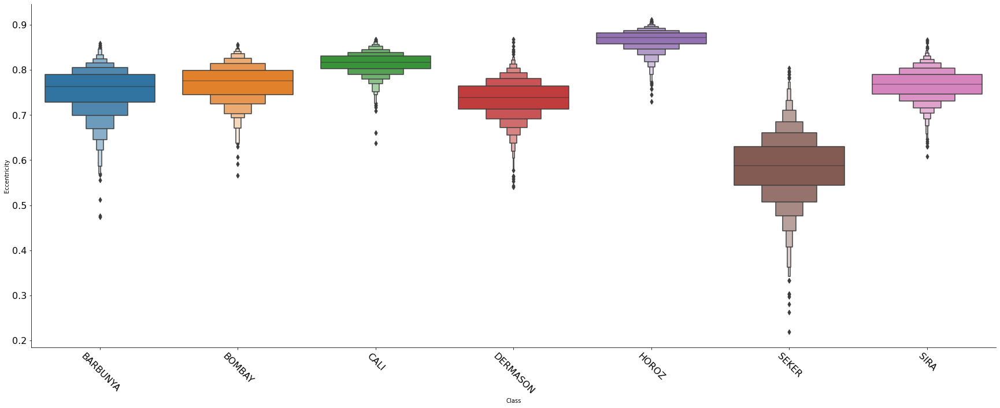

In [58]:
sns.catplot( data=db,kind='boxen', x='Class', y='Eccentricity',
             height = 9, aspect=24/9)
plt.xticks(rotation=-45)
plt.tick_params(labelsize=16)

In [59]:
db_no_BOMBAY=db[db['Class']!='BOMBAY'].copy()

In [60]:
db_no_BOMBAY['Class']= db_no_BOMBAY['Class'].cat.remove_unused_categories()

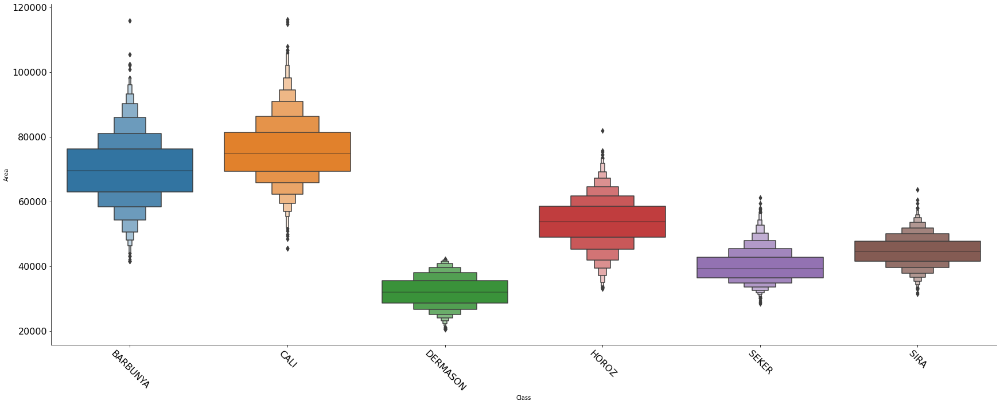

In [61]:
sns.catplot( data=db_no_BOMBAY,kind='boxen', x='Class', y='Area',
             height = 9, aspect=24/9)
plt.xticks(rotation=-45)
plt.tick_params(labelsize=16)

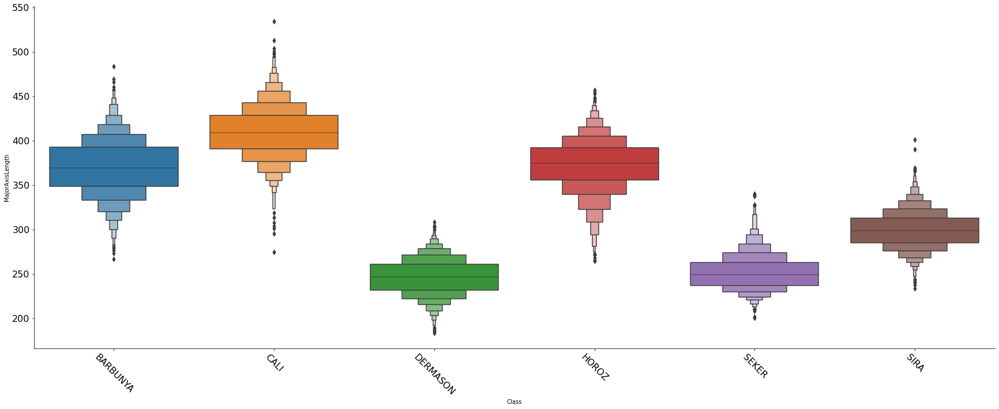

In [62]:
sns.catplot( data=db_no_BOMBAY,kind='boxen', x='Class', y='MajorAxisLength',
             height = 9, aspect=24/9)
plt.xticks(rotation=-45)
plt.tick_params(labelsize=16)

# Machine learning

In [63]:
db.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

## Pairplot

In [64]:
db_ml = db[['Area','Perimeter', 'MajorAxisLength', 'MinorAxisLength','Eccentricity', 'ConvexArea','Class']].copy()

In [65]:
db_ml_desc = db_ml.describe()

In [ ]:
db_ml_desc.to_excel(results_path + 'db_ml.describe.xls')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.
  """Entry point for launching an IPython kernel.


<Figure size 8000x6400 with 0 Axes>

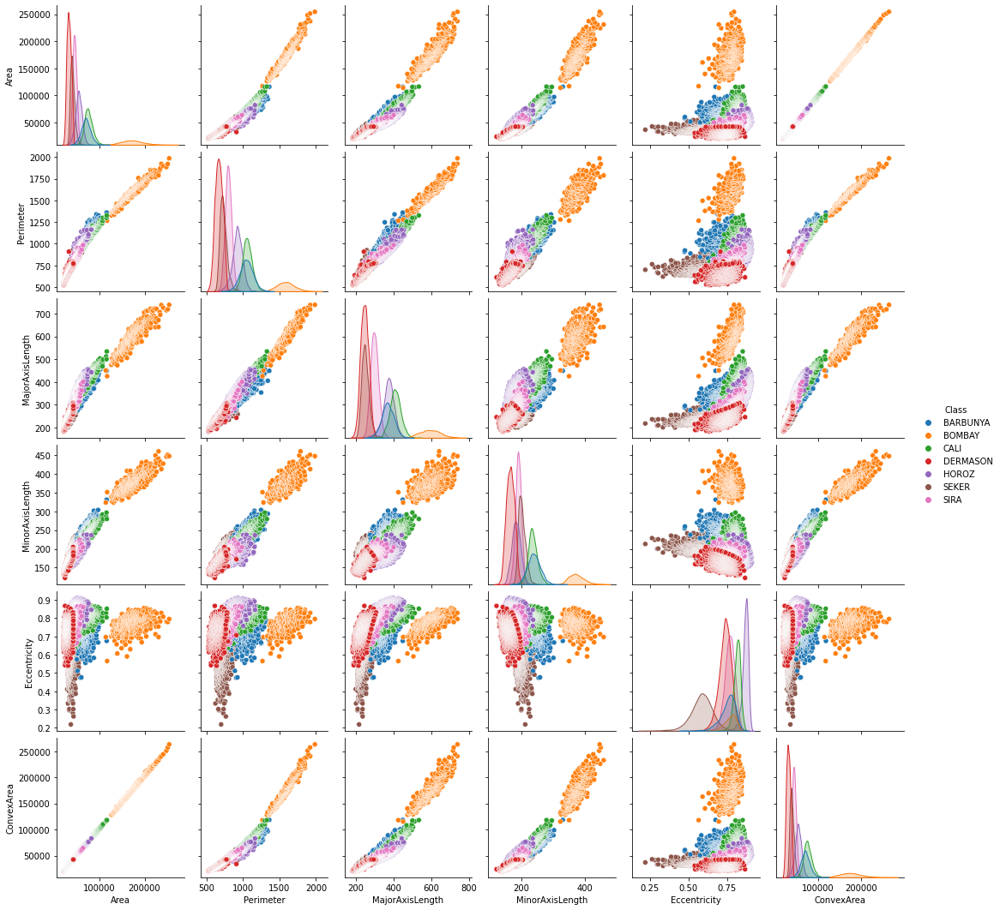

In [ ]:
plt.figure(figsize=(20,16), dpi= 400)

sns.pairplot(db_ml, hue='Class',)

plt.savefig(results_path+'dry_beans_pairplot_ml.png')
plt.savefig(results_path+'dry_beans_pairplot_ml.pdf')


In [66]:
cor_matrix_db=db.corr(method='pearson')
cor_matrix_db.round(2)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,1.00,0.97,0.93,0.95,0.24,0.27,1.00,0.98,0.05,-0.20,-0.36,-0.27,-0.85,-0.64,-0.27,-0.36
Perimeter,0.97,1.00,0.98,0.91,0.39,0.39,0.97,0.99,-0.02,-0.30,-0.55,-0.41,-0.86,-0.77,-0.41,-0.43
MajorAxisLength,0.93,0.98,1.00,0.83,0.55,0.54,0.93,0.96,-0.08,-0.28,-0.60,-0.57,-0.77,-0.86,-0.57,-0.48
MinorAxisLength,0.95,0.91,0.83,1.00,-0.01,0.02,0.95,0.95,0.15,-0.16,-0.21,-0.02,-0.95,-0.47,-0.02,-0.26
AspectRation,0.24,0.39,0.55,-0.01,1.00,0.92,0.24,0.30,-0.37,-0.27,-0.77,-0.99,0.02,-0.84,-0.98,-0.45
Eccentricity,0.27,0.39,0.54,0.02,0.92,1.00,0.27,0.32,-0.32,-0.30,-0.72,-0.97,0.02,-0.86,-0.98,-0.45
ConvexArea,1.00,0.97,0.93,0.95,0.24,0.27,1.00,0.99,0.05,-0.21,-0.36,-0.27,-0.85,-0.64,-0.27,-0.36
EquivDiameter,0.98,0.99,0.96,0.95,0.30,0.32,0.99,1.00,0.03,-0.23,-0.44,-0.33,-0.89,-0.71,-0.33,-0.39
Extent,0.05,-0.02,-0.08,0.15,-0.37,-0.32,0.05,0.03,1.00,0.19,0.34,0.35,-0.14,0.24,0.35,0.15
Solidity,-0.20,-0.30,-0.28,-0.16,-0.27,-0.30,-0.21,-0.23,0.19,1.00,0.61,0.30,0.15,0.34,0.31,0.70


## Correlation Matrix

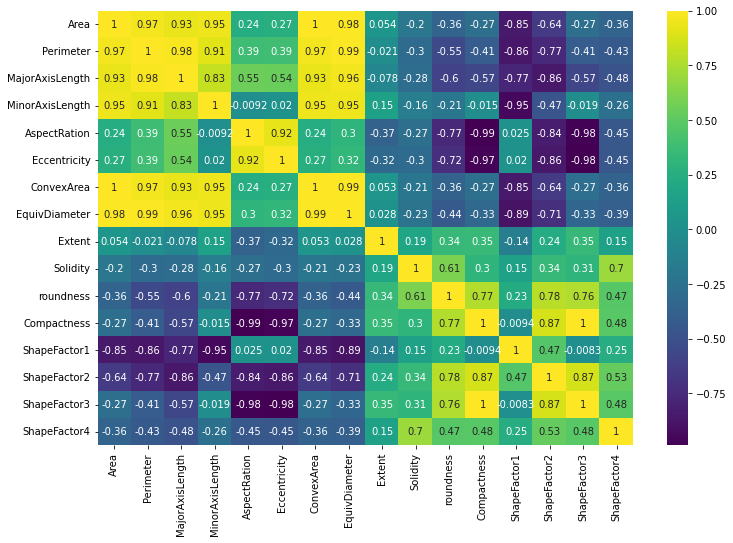

In [67]:
plt.figure(figsize=(12,8))
sns.heatmap(cor_matrix_db, annot=True, cmap='viridis');
plt.savefig(results_path+'db_full_corr.png')
plt.savefig(results_path+'db_full_corr.pdf')

In [ ]:
cor_matrix_db_ml=db_ml.corr(method='pearson')
cor_matrix_db_ml.round(2)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea
Area,1.00,0.97,0.93,0.95,0.27,1.00
Perimeter,0.97,1.00,0.98,0.91,0.39,0.97
MajorAxisLength,0.93,0.98,1.00,0.83,0.54,0.93
MinorAxisLength,0.95,0.91,0.83,1.00,0.02,0.95
Eccentricity,0.27,0.39,0.54,0.02,1.00,0.27
ConvexArea,1.00,0.97,0.93,0.95,0.27,1.00


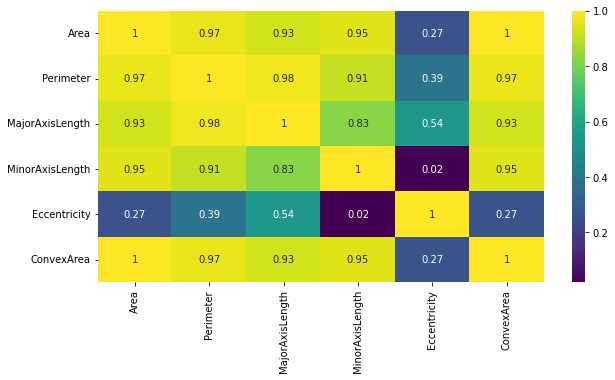

In [ ]:
plt.figure(figsize=(10,5))
sns.heatmap(cor_matrix_db_ml, annot=True, cmap='viridis');
plt.savefig(results_path+'db_ml_corr.png')
plt.savefig(results_path+'db_ml_corr.pdf')

# Linear regression (Perimeter/MajorAxisLength)

(9119, 1)
(9119,)
(4492, 1)
lin_reg_mdl.coef_: [0.38974742]
lin_reg_mdl.intercept_: -13.327765104049547


Text(0.5, -0.05, 'model coefficents (slope):[0.3897], model intercept: -13.3278, mean sq. error: 319.458, R^2: 0.9543')

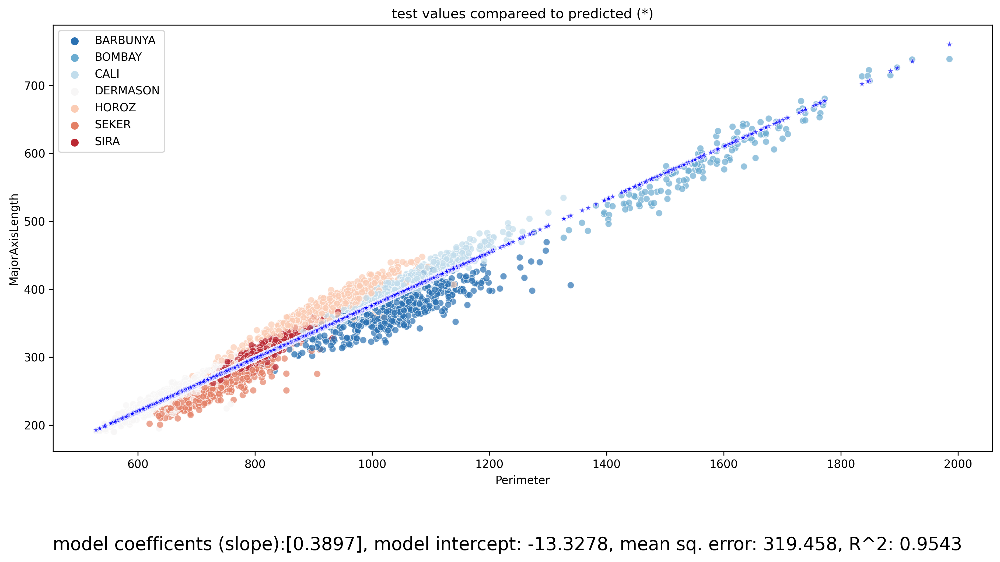

In [ ]:
train, test =  model_selection.train_test_split(db_ml, test_size=0.33,random_state=300, shuffle=True)

#form the arrays needed by sklean, we place two variables into model
X_train=train[['Perimeter']].values
print(X_train.shape)
y_train= train['MajorAxisLength'].values
print(y_train.shape)
#extract the numerical values from the dataframe for all three parameters
X_test=test[['Perimeter']].values
print(X_test.shape)

#build the model
lin_reg_mdl=linear_model.LinearRegression()
#fit the data
lin_reg_mdl.fit(X_train,y_train)
#predict on the test data
yfit = lin_reg_mdl.predict(X_test)

print('lin_reg_mdl.coef_:',lin_reg_mdl.coef_)
print('lin_reg_mdl.intercept_:',lin_reg_mdl.intercept_)

mdl_slope=np.round(lin_reg_mdl.coef_,4)
mdl_inter=np.round(lin_reg_mdl.intercept_,4)
db_ml_MSE = np.round(skl.metrics.mean_squared_error(test['MajorAxisLength'].values, yfit),4)
db_ml_r2 = np.round(skl.metrics.r2_score(test['MajorAxisLength'].values, yfit), 4)

plt.figure(figsize=(15,7), dpi=300)

#sns.scatterplot(data= train, x= 'nrm_inv_city',y= 'nrm_CO2',)

# plot the predicted values and the actual values for the test data on the sameplot
sns.scatterplot(data= test, x= 'Perimeter',y= 'MajorAxisLength',hue='Class',palette='RdBu_r', alpha=0.7)
sns.scatterplot(data= test, x= 'Perimeter',y= yfit,color='blue', alpha=0.7,marker="*")

plt.title('test values compareed to predicted (*)')

caption='model coefficents (slope):{}, model intercept: {}, mean sq. error: {}, R^2: {}'.format(mdl_slope,mdl_inter,db_ml_MSE,db_ml_r2) 
plt.figtext(0.5, -0.05, caption, wrap=True, horizontalalignment='center', fontsize=16)

### Residuals

Text(0.5, 1.0, 'Residuals of Model')

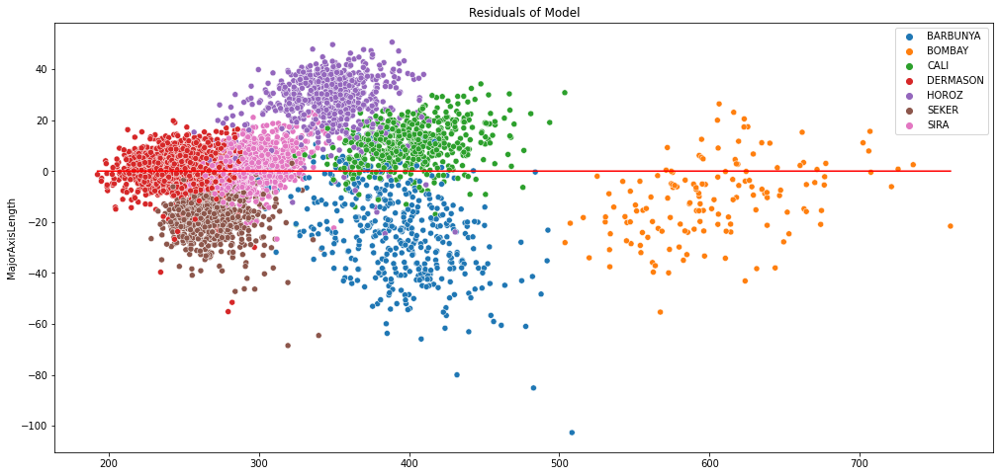

In [ ]:
y_residual= test['MajorAxisLength']-yfit

plt.figure(figsize=(17,8),)
sns.scatterplot( x=yfit, y=y_residual, hue=test['Class'])
sns.lineplot(x=yfit, y=0, color = 'red')
plt.title('Residuals of Model')

# Linear regression (MajorAxisLength/MinorAxisLength)

(9119, 1)
(9119,)
(4492, 1)
lin_reg_mdl.coef_: [1.56695551]
lin_reg_mdl.intercept_: 3.1778533515742993


Text(0.5, -0.05, 'model coefficents (slope):[1.567], model intercept: 3.1779, mean sq. error: 2287.6688, R^2: 0.6725')

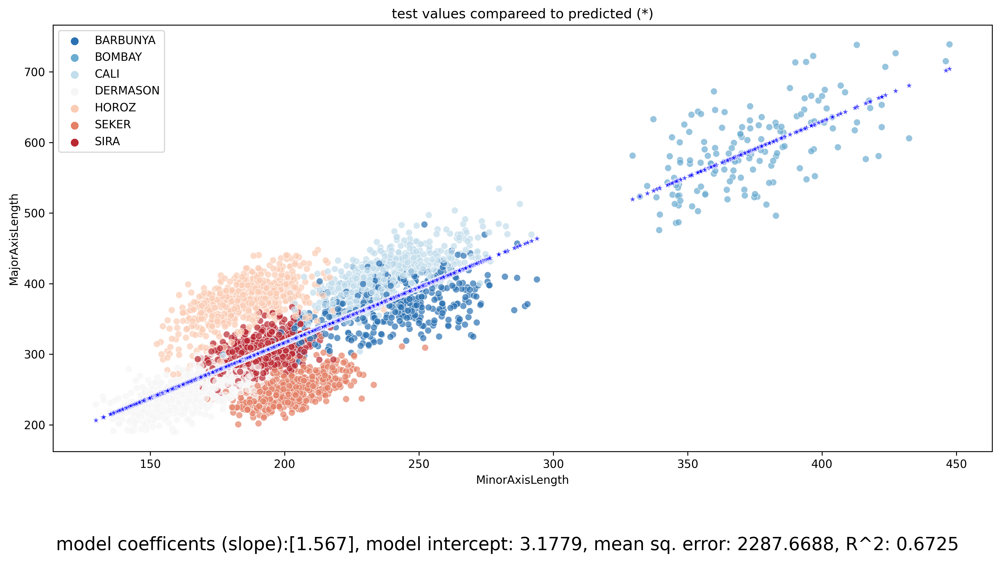

In [ ]:
train, test =  model_selection.train_test_split(db_ml, test_size=0.33,random_state=300, shuffle=True)

#form the arrays needed by sklean, we place two variables into model
X_train=train[['MinorAxisLength']].values
print(X_train.shape)
y_train= train['MajorAxisLength'].values
print(y_train.shape)
#extract the numerical values from the dataframe for all three parameters
X_test=test[['MinorAxisLength']].values
print(X_test.shape)

#build the model
lin_reg_mdl=linear_model.LinearRegression()
#fit the data
lin_reg_mdl.fit(X_train,y_train)
#predict on the test data
yfit = lin_reg_mdl.predict(X_test)

print('lin_reg_mdl.coef_:',lin_reg_mdl.coef_)
print('lin_reg_mdl.intercept_:',lin_reg_mdl.intercept_)

mdl_slope=np.round(lin_reg_mdl.coef_,4)
mdl_inter=np.round(lin_reg_mdl.intercept_,4)
db_ml1_MSE = np.round(skl.metrics.mean_squared_error(test['MajorAxisLength'].values, yfit),4)
db_ml1_r2 = np.round(skl.metrics.r2_score(test['MajorAxisLength'].values, yfit), 4)

plt.figure(figsize=(15,7), dpi=300)

#sns.scatterplot(data= train, x= 'nrm_inv_city',y= 'nrm_CO2',)

# plot the predicted values and the actual values for the test data on the sameplot
sns.scatterplot(data= test, x= 'MinorAxisLength',y= 'MajorAxisLength',hue='Class',palette='RdBu_r', alpha=0.7)
sns.scatterplot(data= test, x= 'MinorAxisLength',y= yfit,color='blue', alpha=0.7,marker="*")

plt.title('test values compareed to predicted (*)')

caption='model coefficents (slope):{}, model intercept: {}, mean sq. error: {}, R^2: {}'.format(mdl_slope,mdl_inter,db_ml1_MSE,db_ml1_r2) 
plt.figtext(0.5, -0.05, caption, wrap=True, horizontalalignment='center', fontsize=16)

### Residuals

Text(0.5, 1.0, 'Residuals of Model')

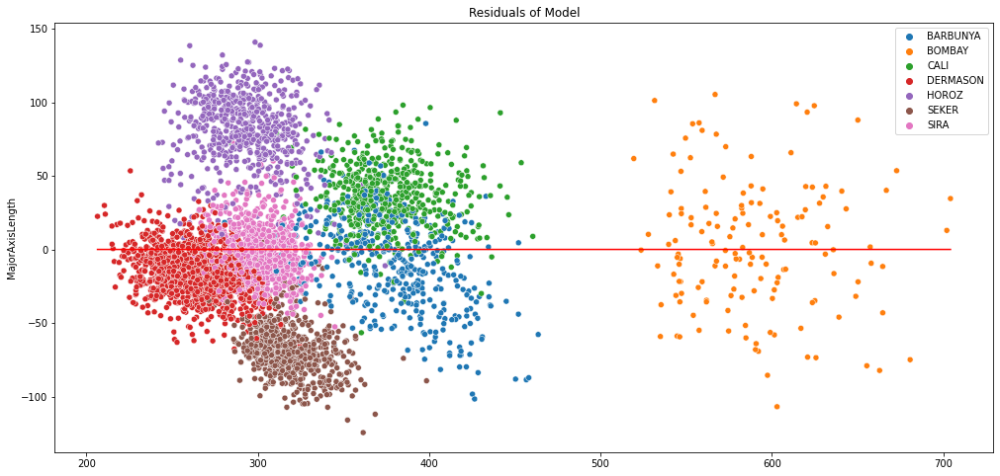

In [ ]:
y_residual= test['MajorAxisLength']-yfit

plt.figure(figsize=(17,8),)
sns.scatterplot( x=yfit, y=y_residual, hue=test['Class'])
sns.lineplot(x=yfit, y=0, color = 'red')
plt.title('Residuals of Model')

# Standard Scaler /Pairplot

In [ ]:
db_ml.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'Eccentricity', 'ConvexArea', 'Class'],
      dtype='object')

In [ ]:
scaler = skl.preprocessing.StandardScaler()
db_ml_Std= scaler.fit_transform(db_ml.iloc[: , :-1].copy())
scl_columns=['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_MinorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea']
db_ml_Std=pd.DataFrame(db_ml_Std, columns = scl_columns)

db_ml_Std['Class']=db_ml['Class']

<Figure size 1008x576 with 0 Axes>

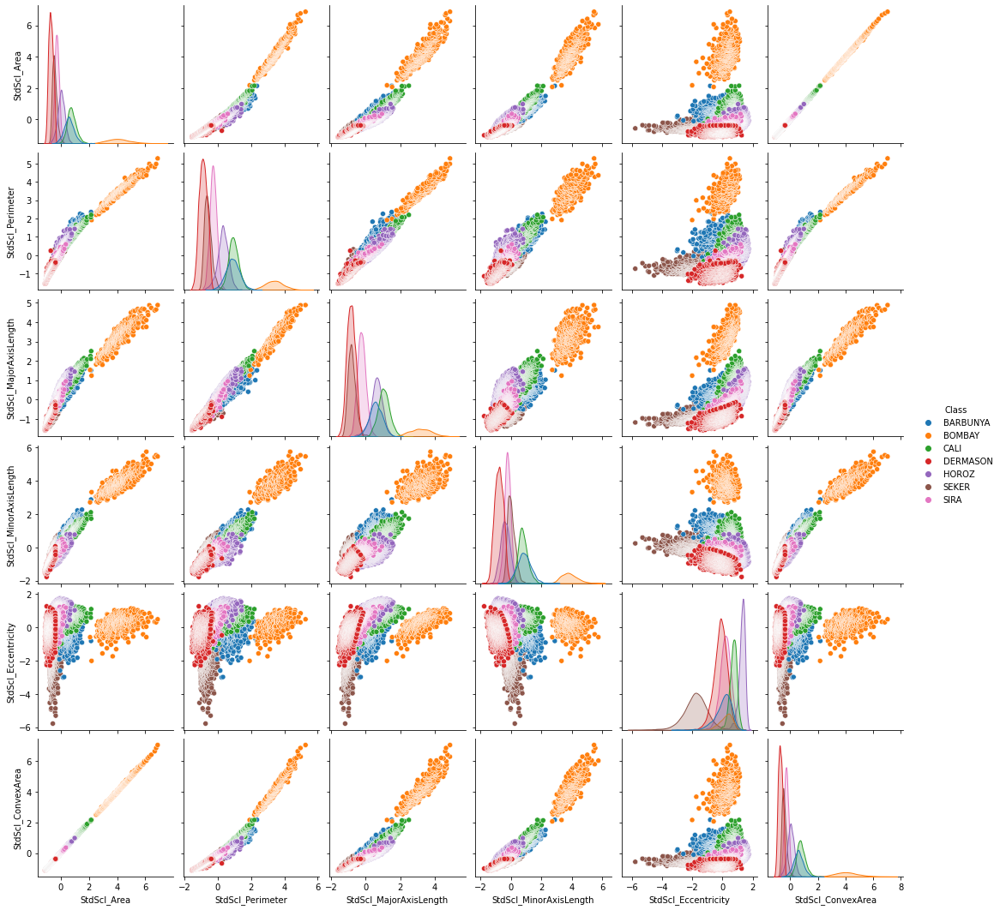

In [ ]:
scaler = skl.preprocessing.StandardScaler()
db_ml_Std= scaler.fit_transform(db_ml.iloc[: , :-1].copy())
scl_columns=['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_MinorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea']
db_ml_Std=pd.DataFrame(db_ml_Std, columns = scl_columns)

db_ml_Std['Class']=db_ml['Class']

plt.figure(figsize=(14,8))
sns.pairplot(db_ml_Std,hue='Class')

plt.savefig(results_path +'db_ml_std_scaler.png')
plt.savefig(results_path +'db_ml_std_scaler.pdf')
db_ml_Std.to_csv(results_path+'db_ml_Std.csv',sep=',', index=False)

### db_ml_Std Inverted 

In [ ]:
db_ml_Std_inv = db_ml_Std[['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_MinorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea','Class']].copy()

db_ml_Std_inv['inv_Std_Area']= 1/(db_ml_Std_inv['StdScl_Area'])
db_ml_Std_inv['inv_Std_Perimeter']= 1/(db_ml_Std_inv['StdScl_Perimeter'])
db_ml_Std_inv['inv_Std_MajorAxisLength']= 1/(db_ml_Std_inv['StdScl_MajorAxisLength'])
db_ml_Std_inv['inv_Std_MinorAxisLength']= 1/(db_ml_Std_inv['StdScl_MinorAxisLength'])
db_ml_Std_inv['inv_Std_Eccentricity']= 1/(db_ml_Std_inv['StdScl_Eccentricity'])
db_ml_Std_inv['inv_Std_ConvexArea']= 1/(db_ml_Std_inv['StdScl_ConvexArea'])

In [ ]:
db_ml_Std_inv.columns

Index(['StdScl_Area', 'StdScl_Perimeter', 'StdScl_MajorAxisLength',
       'StdScl_MinorAxisLength', 'StdScl_Eccentricity', 'StdScl_ConvexArea',
       'Class', 'inv_Std_Area', 'inv_Std_Perimeter', 'inv_Std_MajorAxisLength',
       'inv_Std_MinorAxisLength', 'inv_Std_Eccentricity',
       'inv_Std_ConvexArea'],
      dtype='object')

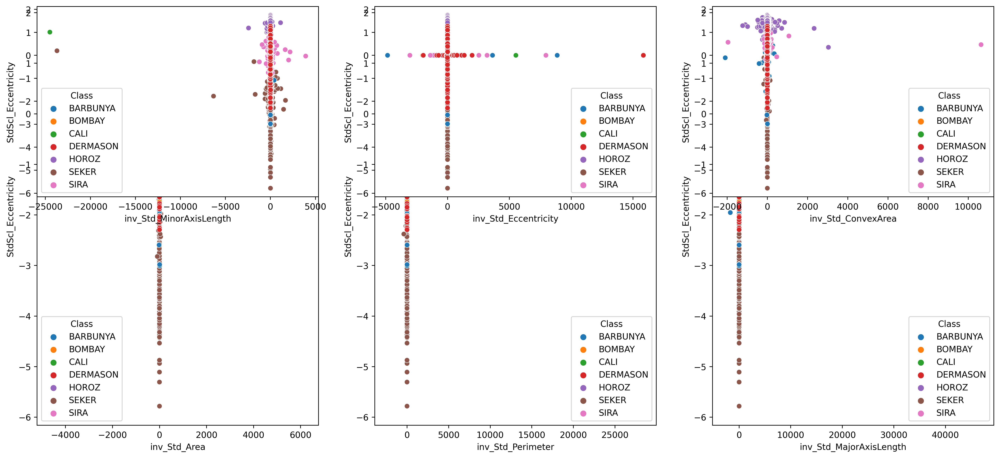

In [ ]:
fig = plt.figure(figsize=(20,9), dpi=350)
fig.add_subplot(1,3,1)
sns.scatterplot(data= db_ml_Std_inv, x= 'inv_Std_Area',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(1,3,2)
sns.scatterplot(data= db_ml_Std_inv, x= 'inv_Std_Perimeter',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(1,3,3)
sns.scatterplot(data= db_ml_Std_inv, x= 'inv_Std_MajorAxisLength',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(2,3,1)
sns.scatterplot(data= db_ml_Std_inv, x= 'inv_Std_MinorAxisLength',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(2,3,2)
sns.scatterplot(data= db_ml_Std_inv, x= 'inv_Std_Eccentricity',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(2,3,3)
sns.scatterplot(data= db_ml_Std_inv, x= 'inv_Std_ConvexArea',y= 'StdScl_Eccentricity', hue='Class')


### db_ml_Std Sqrt

In [ ]:
db_ml_Std_sqrt = db_ml_Std[['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_MinorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea','Class']].copy()

db_ml_Std_sqrt['sqrt_Std_Area']= np.sqrt(db_ml_Std_sqrt['StdScl_Area'])
db_ml_Std_sqrt['sqrt_Std_Perimeter']= np.sqrt(db_ml_Std_sqrt['StdScl_Perimeter'])
db_ml_Std_sqrt['sqrt_Std_MajorAxisLength']= np.sqrt(db_ml_Std_sqrt['StdScl_MajorAxisLength'])
db_ml_Std_sqrt['sqrt_Std_MinorAxisLength']= np.sqrt(db_ml_Std_sqrt['StdScl_MinorAxisLength'])
db_ml_Std_sqrt['sqrt_Std_Eccentricity']= np.sqrt(db_ml_Std_sqrt['StdScl_Eccentricity'])
db_ml_Std_sqrt['sqrt_Std_ConvexArea']= np.sqrt(db_ml_Std_sqrt['StdScl_ConvexArea'])

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [ ]:
db_ml_Std_sqrt.columns

Index(['StdScl_Area', 'StdScl_Perimeter', 'StdScl_MajorAxisLength',
       'StdScl_MinorAxisLength', 'StdScl_Eccentricity', 'StdScl_ConvexArea',
       'Class', 'sqrt_Std_Area', 'sqrt_Std_Perimeter',
       'sqrt_Std_MajorAxisLength', 'sqrt_Std_MinorAxisLength',
       'sqrt_Std_Eccentricity', 'sqrt_Std_ConvexArea'],
      dtype='object')

In [ ]:
fig = plt.figure(figsize=(20,9), dpi=350)
fig.add_subplot(1,3,1)
sns.scatterplot(data= db_ml_Std_sqrt, x= 'sqrt_Std_Area',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(1,3,2)
sns.scatterplot(data= db_ml_Std_sqrt, x= 'sqrt_Std_Perimeter',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(1,3,3)
sns.scatterplot(data= db_ml_Std_sqrt, x= 'sqrt_Std_MajorAxisLength',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(2,3,1)
sns.scatterplot(data= db_ml_Std_sqrt, x= 'sqrt_Std_MinorAxisLength',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(2,3,2)
sns.scatterplot(data= db_ml_Std_sqrt, x= 'sqrt_Std_Eccentricity',y= 'StdScl_Eccentricity', hue='Class')
fig.add_subplot(2,3,3)
sns.scatterplot(data= db_ml_Std_sqrt, x= 'sqrt_Std_ConvexArea',y= 'StdScl_Eccentricity', hue='Class')

Output hidden; open in https://colab.research.google.com to view.

# Multifactor regression

## StdScl_MinorAxisLength 

In [ ]:
db_ml_Std.columns

Index(['StdScl_Area', 'StdScl_Perimeter', 'StdScl_MajorAxisLength',
       'StdScl_MinorAxisLength', 'StdScl_Eccentricity', 'StdScl_ConvexArea',
       'Class'],
      dtype='object')

(9119, 5)
(9119,)
(4492, 5)


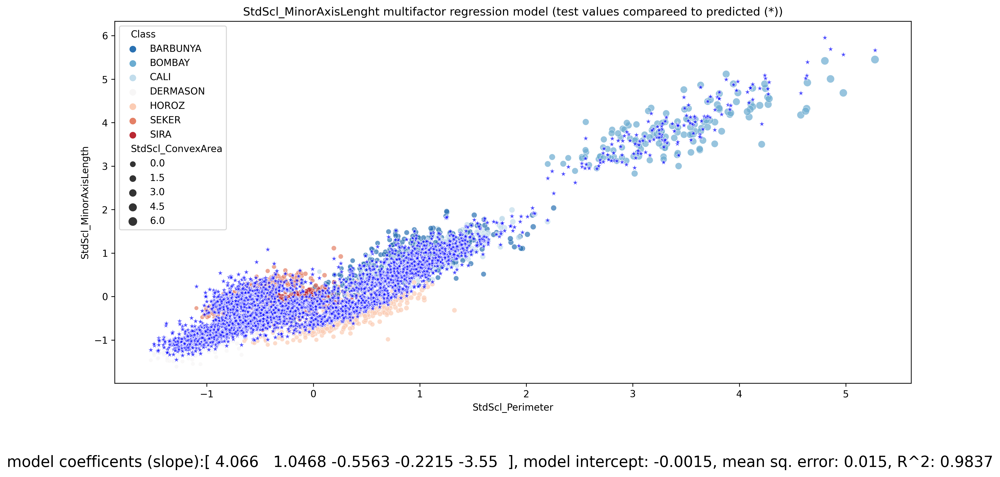

In [ ]:
train, test =  model_selection.train_test_split(db_ml_Std, test_size=0.33,random_state=300, shuffle=True)

#form the arrays needed by sklean, we place two variables into model
X_train=train[['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea']].values
print(X_train.shape)
y_train= train['StdScl_MinorAxisLength'].values
print(y_train.shape)
#extract the numerical values from the dataframe for all three parameters
X_test=test[['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea']].values
print(X_test.shape)

#build the model
lin_reg_mdl=linear_model.LinearRegression()
#fit the data
lin_reg_mdl.fit(X_train,y_train)
#predict on the test data
yfit = lin_reg_mdl.predict(X_test)

mdl_slope=np.round(lin_reg_mdl.coef_,4)
mdl_inter=np.round(lin_reg_mdl.intercept_,4)
db_StdScl_MSE = np.round(skl.metrics.mean_squared_error(test['StdScl_MinorAxisLength'].values, yfit),4)
db_StdScl_r2 = np.round(skl.metrics.r2_score(test['StdScl_MinorAxisLength'].values, yfit), 4)

plt.figure(figsize=(15,7), dpi=300)

#sns.scatterplot(data= train, x= 'nrm_inv_city',y= 'nrm_CO2',)

# plot the predicted values and the actual values for the test data on the sameplot
sns.scatterplot(data= test, x= 'StdScl_Perimeter',y= 'StdScl_MinorAxisLength',hue='Class',size='StdScl_ConvexArea',palette='RdBu_r', alpha=0.7)
sns.scatterplot(data= test, x= 'StdScl_Perimeter',y= yfit,color='blue', alpha=0.7,marker="*")

plt.title('StdScl_MinorAxisLenght multifactor regression model (test values compareed to predicted (*))')

caption='model coefficents (slope):{}, model intercept: {}, mean sq. error: {}, R^2: {}'.format(mdl_slope,mdl_inter,db_StdScl_MSE,db_StdScl_r2) 
plt.figtext(0.5, -0.05, caption, wrap=True, horizontalalignment='center', fontsize=16)

plt.savefig(data_path+'MinorAxis_multiRegression.pdf')
plt.savefig(data_path+'MinorAxis_multiRegression.png')

## Residuals

Text(0.5, 1.0, 'Residuals of Model')

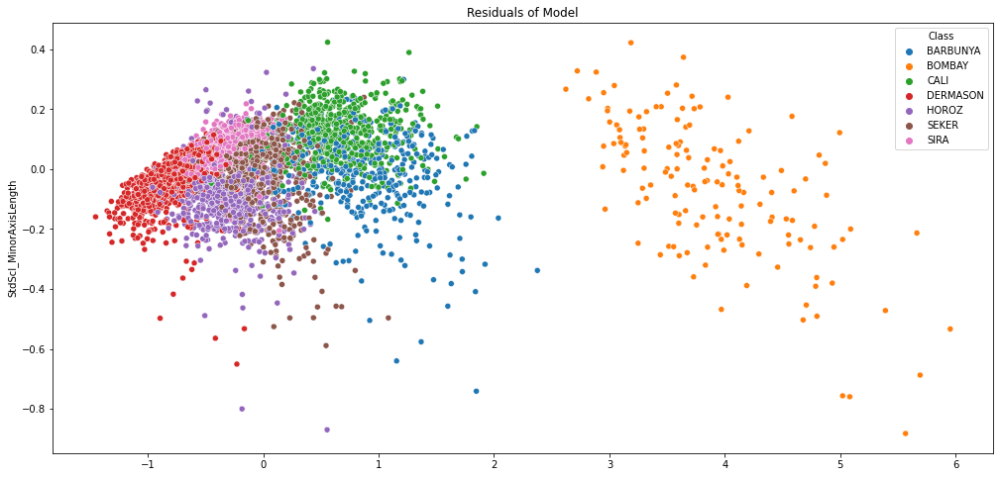

In [ ]:
y_residual= test['StdScl_MinorAxisLength']-yfit

plt.figure(figsize=(17,8),)
sns.scatterplot( x=yfit, y=y_residual, hue=test['Class'])
plt.title('Residuals of Model')

In [ ]:
corrs=db_ml_Std.corr()
corrs

,StdScl_Area,StdScl_Perimeter,StdScl_MajorAxisLength,StdScl_MinorAxisLength,StdScl_Eccentricity,StdScl_ConvexArea
StdScl_Area,1.000000,0.966722,0.931834,0.951602,0.267481,0.999939
StdScl_Perimeter,0.966722,1.000000,0.977338,0.913179,0.391066,0.967689
StdScl_MajorAxisLength,0.931834,0.977338,1.000000,0.826052,0.541972,0.932607
StdScl_MinorAxisLength,0.951602,0.913179,0.826052,1.000000,0.019574,0.951339
StdScl_Eccentricity,0.267481,0.391066,0.541972,0.019574,1.000000,0.269255
StdScl_ConvexArea,0.999939,0.967689,0.932607,0.951339,0.269255,1.000000


# Variance Inflation Factor

In [ ]:
def calculate_vif(df, features):    
    vif, tolerance = {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 =linear_model.LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance})

In [ ]:
calculate_vif(df=db_ml_Std, features=['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_Eccentricity', 'StdScl_ConvexArea'])

,VIF,Tolerance
StdScl_Area,9950.095970,0.000101
StdScl_Perimeter,74.445070,0.013433
StdScl_MajorAxisLength,79.663403,0.012553
StdScl_Eccentricity,4.945914,0.202187
StdScl_ConvexArea,10179.603137,0.000098


In [ ]:
calculate_vif(df=db_ml_Std, features=['StdScl_Area','StdScl_Perimeter','StdScl_MajorAxisLength','StdScl_Eccentricity',])

,VIF,Tolerance
StdScl_Area,21.372069,0.046790
StdScl_Perimeter,62.881388,0.015903
StdScl_MajorAxisLength,74.289228,0.013461
StdScl_Eccentricity,4.752194,0.210429


In [ ]:
calculate_vif(df=db_ml_Std, features=['StdScl_Area','StdScl_Perimeter','StdScl_Eccentricity',])

,VIF,Tolerance
StdScl_Area,19.602027,0.051015
StdScl_Perimeter,21.485383,0.046543
StdScl_Eccentricity,1.514540,0.660267


In [ ]:
calculate_vif(df=db_ml_Std, features=['StdScl_Area','StdScl_Eccentricity',])

,VIF,Tolerance
StdScl_Area,1.07706,0.928454
StdScl_Eccentricity,1.07706,0.928454


# Multifactor regression - simpler model Area & Eccentricity

(9119, 2)
(9119,)
(4492, 2)


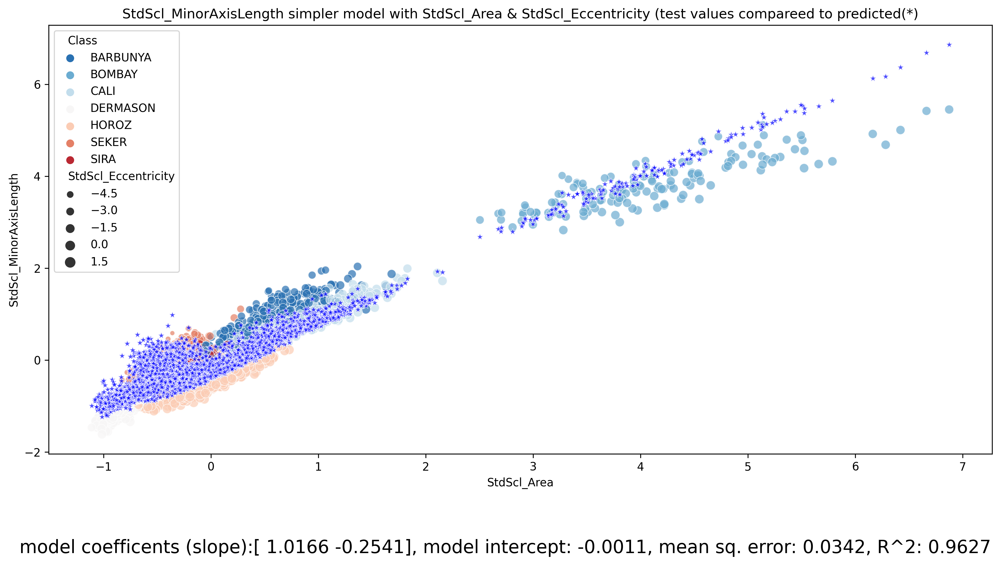

In [ ]:
train, test =  model_selection.train_test_split(db_ml_Std, test_size=0.33,random_state=300, shuffle=True)

#build the model
lin_reg_mdl=linear_model.LinearRegression()

#form the arrays needed by sklean, we place two variables into model
X_train=train[['StdScl_Area','StdScl_Eccentricity']].values
print(X_train.shape)
y_train= train['StdScl_MinorAxisLength'].values
print(y_train.shape)

#fit the data
lin_reg_mdl.fit(X_train,y_train)

#extract the numerical values from the dataframe for all three parameters
X_test=test[['StdScl_Area','StdScl_Eccentricity']].values
print(X_test.shape)

#predict on the test data
yfit = lin_reg_mdl.predict(X_test)
mdl_slope=np.round(lin_reg_mdl.coef_,4)

mdl_inter=np.round(lin_reg_mdl.intercept_,4)

db_ml_Std_simple_MSE = np.round(skl.metrics.mean_squared_error(test['StdScl_MinorAxisLength'].values, yfit),4)

db_ml_Std_simple_r2 = np.round(skl.metrics.r2_score(test['StdScl_MinorAxisLength'].values, yfit), 4)

plt.figure(figsize=(15,7), dpi=300)

#sns.scatterplot(data= train, x= 'nrm_inv_city',y= 'nrm_CO2',)


# plot the predicted values and the actual values for the test data on the sameplot
sns.scatterplot(data= test, x= 'StdScl_Area',y= 'StdScl_MinorAxisLength',hue='Class',size='StdScl_Eccentricity',palette='RdBu_r', alpha=0.7)
sns.scatterplot(data= test, x= 'StdScl_Area',y= yfit,color='blue', alpha=0.7,marker="*")

plt.title('StdScl_MinorAxisLength simpler model with StdScl_Area & StdScl_Eccentricity (test values compareed to predicted(*)')

caption='model coefficents (slope):{}, model intercept: {}, mean sq. error: {}, R^2: {}'.format(mdl_slope,mdl_inter,db_ml_Std_simple_MSE,db_ml_Std_simple_r2) 
plt.figtext(0.5, -0.05, caption, wrap=True, horizontalalignment='center', fontsize=16)
plt.savefig(data_path+'StdScl_MinorAxisLength_simpler_model.pdf')
plt.savefig(data_path+'StdScl_MinorAxisLength_simpler_model.png')

(9119, 2)
(9119,)
(4492, 2)


Text(0.5, -0.05, 'model coefficents (slope):[ 1.0166 -0.2541], model intercept: -0.0011, mean sq. error: 0.0342, R^2: 0.9627')

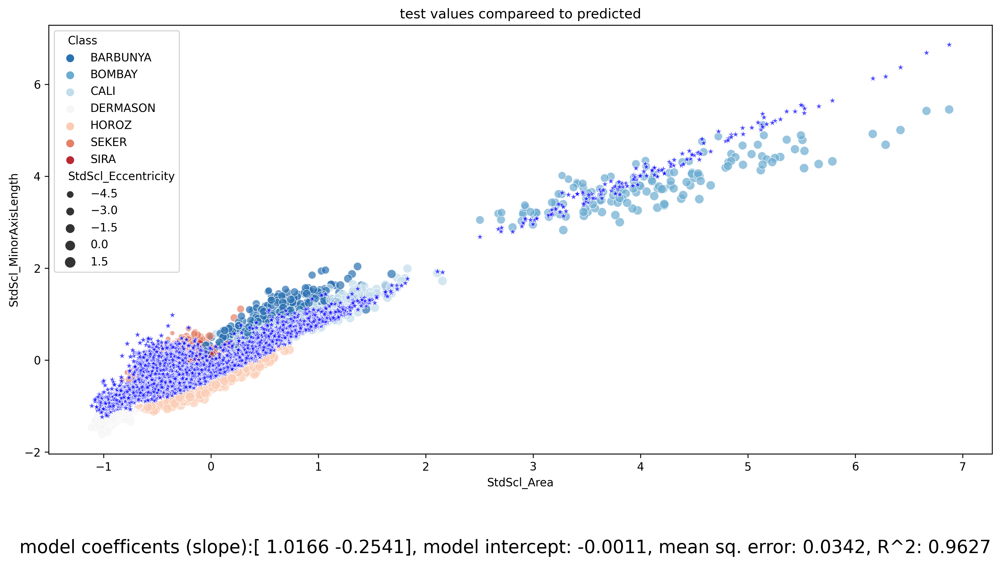

In [ ]:
train, test =  model_selection.train_test_split(db_ml_Std, test_size=0.33,random_state=300, shuffle=True)

#form the arrays needed by sklean, we place two variables into model
X_train=train[['StdScl_Area','StdScl_Eccentricity']].values
print(X_train.shape)
y_train= train['StdScl_MinorAxisLength'].values
print(y_train.shape)
#extract the numerical values from the dataframe for all three parameters
X_test=test[['StdScl_Area','StdScl_Eccentricity']].values
print(X_test.shape)

#build the model
lin_reg_mdl=linear_model.LinearRegression()
#fit the data
lin_reg_mdl.fit(X_train,y_train)
#predict on the test data
yfit = lin_reg_mdl.predict(X_test)

mdl_slope=np.round(lin_reg_mdl.coef_,4)
mdl_inter=np.round(lin_reg_mdl.intercept_,4)
db_StdScl_MSE = np.round(skl.metrics.mean_squared_error(test['StdScl_MinorAxisLength'].values, yfit),4)
db_StdScl_r2 = np.round(skl.metrics.r2_score(test['StdScl_MinorAxisLength'].values, yfit), 4)

plt.figure(figsize=(15,7), dpi=300)

#sns.scatterplot(data= train, x= 'nrm_inv_city',y= 'nrm_CO2',)

# plot the predicted values and the actual values for the test data on the sameplot
sns.scatterplot(data= test, x= 'StdScl_Area',y= 'StdScl_MinorAxisLength',hue='Class',size='StdScl_Eccentricity',palette='RdBu_r', alpha=0.7)
sns.scatterplot(data= test, x= 'StdScl_Area',y= yfit,color='blue', alpha=0.7,marker="*")

plt.title('test values compareed to predicted')

caption='model coefficents (slope):{}, model intercept: {}, mean sq. error: {}, R^2: {}'.format(mdl_slope,mdl_inter,db_StdScl_MSE,db_StdScl_r2) 
plt.figtext(0.5, -0.05, caption, wrap=True, horizontalalignment='center', fontsize=16)

##Residuals

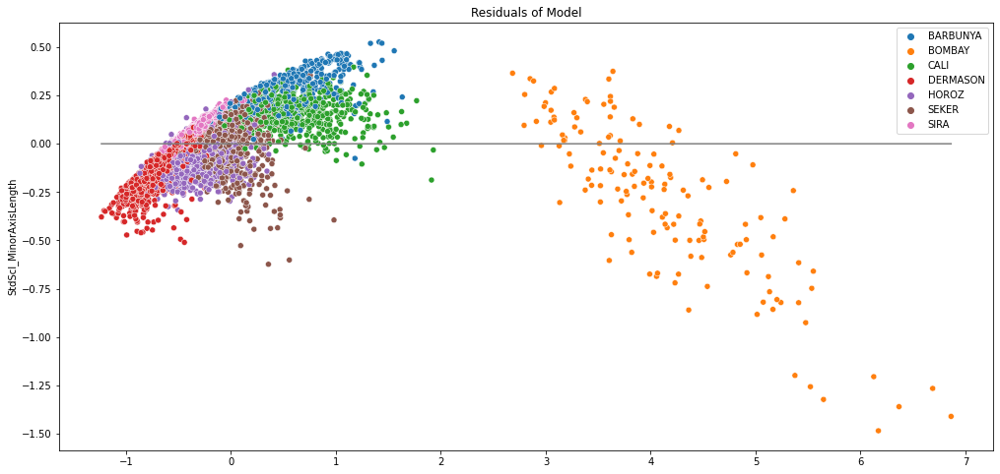

In [ ]:
y_residual= test['StdScl_MinorAxisLength']-yfit

plt.figure(figsize=(17,8),)
sns.scatterplot( x=yfit, y=y_residual, hue=test['Class'])
sns.lineplot(x=yfit, y=0, color = 'grey')
plt.title('Residuals of Model')

plt.savefig(data_path+'StdScl_MinorAxisLength_simpler_model_residuals.pdf')
plt.savefig(data_path+'StdScl_MinorAxisLength_simpler_model_residuals.png')

The model explains 96% of the total varience.